Cyna Shirazinejad, 1/17/22

# Notebook 8: compare cell lines

outline:

* compare the following attributes:
* * principal component distributions
* * maximum intensities
* * lifetimes
* * initiation rates of events

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
import numpy as np
import pandas as pd
import sys
import matplotlib.pyplot as plt
import seaborn as sns
unique_user_saved_outputs = str(np.load('unique_user_saved_outputs_simplified.npy'))
analysis_metadata = np.load(unique_user_saved_outputs+'/dataframes/analysis_metadata.npy', allow_pickle=True)
sys.path.append(analysis_metadata.item().get('path_notebook')+'/cmeAnalysisPostProcessingSimplified') # add custom Python scripts to the local path
import compare_tracks

# show that dataframes are same as old versions of analysis

In [2]:
df_merged_features_old = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs/dataframes/df_merged_features.zip')

In [3]:
df_merged_features_old

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,number_significant_dnm2,max_consecutive_significant_dnm2,fraction_significant_dnm2,fraction_peak_ap2,fraction_peak_dnm2,experiment_number,number_of_channels,date,cell_condition,cmeAnalysis_dynamin2_prediction
0,216.0,1796.284550,740.516756,7.203812,7.203812,2.630656,0.566262,0.725913,159.0,186.0,...,167.0,43.0,0.738938,0.703540,0.823009,0.0,2.0,200804.0,no-treatment,1.0
1,201.0,2215.532695,1505.433273,17.220726,14.507135,3.797526,0.424574,0.912671,111.0,107.0,...,115.0,89.0,0.545024,0.526066,0.507109,0.0,2.0,200804.0,no-treatment,1.0
2,201.0,864.976087,421.405691,17.621866,17.130473,3.472332,0.566588,0.776404,42.0,44.0,...,167.0,70.0,0.791469,0.199052,0.208531,0.0,2.0,200804.0,no-treatment,1.0
3,192.0,509.795166,356.302521,10.804211,13.292842,5.888569,0.428736,1.058177,44.0,190.0,...,112.0,57.0,0.554455,0.217822,0.940594,0.0,2.0,200804.0,no-treatment,1.0
4,188.0,1636.422386,883.606436,11.255090,7.793074,5.531006,0.415792,0.753372,174.0,169.0,...,169.0,80.0,0.853535,0.878788,0.853535,0.0,2.0,200804.0,no-treatment,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59234,2.0,28.623953,19.042675,1.879691,2.915253,2.389665,1.092336,1.354985,6.0,0.0,...,0.0,0.0,0.000000,0.500000,0.000000,7.0,2.0,200819.0,no-treatment,0.0
59235,2.0,15.164065,14.946216,7.447355,2.666432,6.454259,2.453558,1.923304,6.0,3.0,...,0.0,0.0,0.000000,0.500000,0.250000,7.0,2.0,200819.0,no-treatment,0.0
59236,2.0,21.879792,26.215772,4.384565,1.665404,4.318207,1.873770,2.418798,6.0,6.0,...,1.0,1.0,0.083333,0.500000,0.500000,7.0,2.0,200819.0,no-treatment,0.0
59237,2.0,20.236623,13.954595,1.079388,2.888644,3.897009,0.843483,2.105214,6.0,11.0,...,0.0,0.0,0.000000,0.500000,0.916667,7.0,2.0,200819.0,no-treatment,0.0


In [4]:
feature_units = analysis_metadata.item().get('feature_units')

In [5]:
# ad experiments dataframe
df_merged_features = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_merged_features.zip')
# ada experiments dataframe
df_ada_merged_features = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_ada_merged_features.zip')
# shock experiments dataframe
df_ada_shock_merged_features = pd.read_csv(unique_user_saved_outputs+'/dataframes/df_ada_shock_merged_features.zip')

In [6]:
values_df_merged_features_old = df_merged_features_old.values[:,:len(feature_units)].astype('float')

In [7]:
values_df_merged_features = df_merged_features.values[:,:len(feature_units)].astype('float')

In [8]:
for i in range(100):
    print(np.sum(np.around(values_df_merged_features_old, i) - np.around(values_df_merged_features, i)))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-2.000017929049136e-10
-2.999822612537173e-11
1.1697087742845724e-11
2.6821656007314232e-11
-4.31374380660543e-12
-1.2779333147250327e-11
-1.354995976532436e-11
-1.3850589945796354e-11
-1.4445620616582514e-11
-1.3850909785437238e-11
-1.581612450260602e-11
-1.5672911590509236e-11
-1.5823249543858546e-11
-1.629812724260023e-11
-1.3912020193756211e-11
-1.5109595381644506e-11
-1.628984141723239e-11
-1.4185444489114027e-11
-1.5027538841262547e-11
-1.3857930865253951e-11
-1.7514967700206583e-11
-1.4948565121337834e-11
-1.4547519645754766e-11
-1.2923817692970163e-11
-1.3413875333433871e-11
-1.377477874535296e-11
-1.6081528818968687e-11
-1.5610213700145573e-11
-1.632852887121605e-11
-1.4189203672155919e-11
-1.5770314365509555e-11
-1.3936813668050238e-11
-1.631013582859323e-11
-1.5548990755029227e-11
-1.3813670083555156e-11
-1.4608980298809297e-11
-1.4619518516921027e-11
-1.328994186361042e-11
-1.730630163509399e-11
-1.4850783380408782e-11
-1.491217378732

In [13]:
for i in range(100):
    print('number of decimal places:', i)
    for j in range(len(feature_units)):
        print('column:', j)
        print(np.sum(np.around(values_df_merged_features_old[:,j], i) - np.around(values_df_merged_features[:,j], i)))

number of decimal places: 0
column: 0
0.0
column: 1
0.0
column: 2
0.0
column: 3
0.0
column: 4
0.0
column: 5
0.0
column: 6
0.0
column: 7
0.0
column: 8
0.0
column: 9
0.0
column: 10
0.0
column: 11
0.0
column: 12
0.0
column: 13
0.0
column: 14
0.0
column: 15
0.0
column: 16
0.0
column: 17
0.0
column: 18
0.0
column: 19
0.0
column: 20
0.0
column: 21
0.0
column: 22
0.0
column: 23
0.0
column: 24
0.0
column: 25
0.0
column: 26
0.0
column: 27
0.0
column: 28
0.0
column: 29
0.0
column: 30
0.0
column: 31
0.0
number of decimal places: 1
column: 0
0.0
column: 1
0.0
column: 2
0.0
column: 3
0.0
column: 4
0.0
column: 5
0.0
column: 6
0.0
column: 7
0.0
column: 8
0.0
column: 9
0.0
column: 10
0.0
column: 11
0.0
column: 12
0.0
column: 13
0.0
column: 14
0.0
column: 15
0.0
column: 16
0.0
column: 17
0.0
column: 18
0.0
column: 19
0.0
column: 20
0.0
column: 21
0.0
column: 22
0.0
column: 23
0.0
column: 24
0.0
column: 25
0.0
column: 26
0.0
column: 27
0.0
column: 28
0.0
column: 29
0.0
column: 30
0.0
column: 31
0.0
numb

In [14]:
df_merged_ada_features_old = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs/dataframes/df_new_incorporated_data_merged_features.zip')

In [15]:
df_merged_ada_features_old_no_two_color = df_merged_ada_features_old.iloc[df_merged_features.shape[0]:]

In [11]:
df_merged_ada_features_old_no_two_color

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,number_significant_dnm2,max_consecutive_significant_dnm2,fraction_significant_dnm2,fraction_peak_ap2,fraction_peak_dnm2,experiment_number,number_of_channels,date,cell_condition,cmeAnalysis_dynamin2_prediction
59239,197.0,1807.957032,1229.909514,10.128880,11.523833,3.863201,0.515501,0.713180,103.0,143.0,...,148.0,99.0,0.714976,0.497585,0.690821,8.0,3.0,200804.0,no_treatment,1.0
59240,195.0,1104.917675,1558.360759,24.093699,22.910047,3.158071,0.301681,0.534243,64.0,120.0,...,176.0,163.0,0.858537,0.312195,0.585366,8.0,3.0,200804.0,no_treatment,1.0
59241,194.0,1103.108158,1827.655903,29.493246,29.710737,4.548993,0.390344,0.644309,149.0,196.0,...,124.0,38.0,0.607843,0.730392,0.960784,8.0,3.0,200804.0,no_treatment,1.0
59242,185.0,669.325535,311.324581,36.450172,33.370516,3.670640,0.307503,0.596749,153.0,126.0,...,87.0,58.0,0.446154,0.784615,0.646154,8.0,3.0,200804.0,no_treatment,1.0
59243,184.0,968.791028,571.785312,13.916530,10.736709,2.575172,0.410520,0.663012,119.0,120.0,...,98.0,64.0,0.505155,0.613402,0.618557,8.0,3.0,200804.0,no_treatment,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154359,2.0,71.707995,35.951988,5.059682,5.014421,2.181787,0.766658,1.257316,5.0,4.0,...,0.0,0.0,0.000000,0.416667,0.333333,20.0,3.0,200722.0,no_treatment,0.0
154360,2.0,25.338391,38.053364,2.261592,2.067468,4.632292,1.427061,1.486410,6.0,2.0,...,7.0,3.0,0.583333,0.500000,0.166667,20.0,3.0,200722.0,no_treatment,1.0
154361,2.0,207.539790,166.846303,2.391855,2.634261,4.270496,1.536834,1.356576,5.0,0.0,...,5.0,3.0,0.416667,0.416667,0.000000,20.0,3.0,200722.0,no_treatment,1.0
154362,2.0,16.610995,36.530651,3.546351,2.761683,3.700703,1.630578,1.907946,5.0,9.0,...,2.0,1.0,0.166667,0.416667,0.750000,20.0,3.0,200722.0,no_treatment,0.0


In [19]:
values_df_merged_ada_features_old = df_merged_ada_features_old_no_two_color.values[:,:len(feature_units)].astype('float')

In [20]:
values_df_merged_ada_features = df_ada_merged_features.values[:,:len(feature_units)].astype('float')

In [21]:
for i in range(100):
    print(np.sum(np.around(values_df_merged_ada_features_old, i) - np.around(values_df_merged_ada_features, i)))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
-9.99999860695766e-10
4.000764164402426e-10
-1.9979573551154317e-11
3.2652103243435704e-11
3.05575842407535e-11
-1.5920976342842508e-11
-2.7790880707811993e-11
-2.987847903118679e-11
-2.9455311887499613e-11
-3.009727742638718e-11
-2.9654460365156204e-11
-2.947692532228284e-11
-3.053367703905504e-11
-3.000474014670226e-11
-2.8301679913411595e-11
-3.1174801468296755e-11
-3.0799571429199234e-11
-3.1538697922803977e-11
-2.625030313205826e-11
-3.0234848410417463e-11
-2.7816284701431544e-11
-3.091231151447878e-11
-3.0610538354524026e-11
-2.691472921914444e-11
-2.8629452756458586e-11
-3.076497059408982e-11
-3.158972763108142e-11
-2.8226656892372214e-11
-2.900781467700869e-11
-3.0741251422694224e-11
-3.1678153657632886e-11
-2.925401324635257e-11
-3.151996567397897e-11
-3.061932332031406e-11
-3.0178147523484756e-11
-3.1631317748390705e-11
-3.0234334294452765e-11
-2.915026965301284e-11
-2.992733874947358e-11
-3.057637414202903e-11
-2.889699512035243e-11
-3.131

# compare rates of track categories

In [16]:
df_test = compare_tracks.compare_frequencies_all_track_categories([analysis_metadata.item().get('path_tracks_ad_wildtype')],
                                            [['Cell']])


folders to mine for track set 1:
0_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
1_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
2_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s
3_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell007_1s
4_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell010_1s
5_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
6_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
7_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s


loading tracks in set..
tracks in set 1 of 8
tracks in set 2 of 8
tracks in set 3 of 8
tracks in set 4 of 8
tracks in set 5 of 8
tracks in set 6 of 8
tracks in set 7 of 8
tracks in set 8 of 8






In [17]:
df_test

,counts,frequency,category,condition
0,7510.0,0.491460,1.0,0.0
1,4713.0,0.308422,2.0,0.0
2,2293.0,0.150056,3.0,0.0
3,65.0,0.004254,4.0,0.0
4,171.0,0.011190,5.0,0.0
...,...,...,...,...
59,32.0,0.002026,4.0,0.0
60,183.0,0.011585,5.0,0.0
61,216.0,0.013674,6.0,0.0
62,338.0,0.021398,7.0,0.0


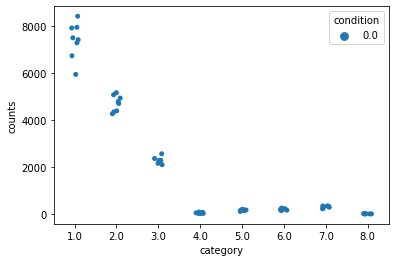

In [18]:
g = sns.stripplot(data=df_test,
                  x='category',
                  y='counts',
                  hue='condition',
                  dodge=True)


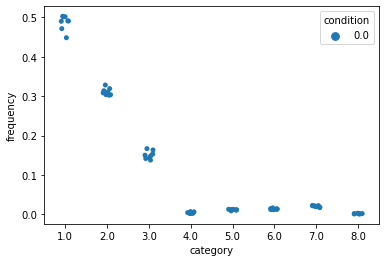

In [19]:
g = sns.stripplot(data=df_test,
                  x='category',
                  y='frequency',
                  hue='condition',
                  dodge=True)


In [32]:
path_ada_tracks = '/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/tracking_data/ADA_cellline_analysis_formatted_temp/'
ada_shock_tracks = '/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/revision_tracking/hypotonic_tracking_data_ap2dnm2'
ada_drug_tracks = '/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/revision_tracking/ck666_tracking_data_ap2dnm2'

In [33]:
ada_shock_tracks_repeat_2 = '/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/revision_tracking/hypotonic_tracking_data_211208_ap2dnm2'


In [34]:
df_ada_shock_merged_features = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs_simplified_new/dataframes/df_ada_shock_merged_features.zip')
df = df_ada_shock_merged_features
df_ada_shock_merged_features_before = df[df['cell_condition'].str.contains('before')]
df_ada_shock_merged_features_after = df[df['cell_condition'].str.contains('after')]

In [88]:
df_ada_shock_merged_features_before_repeat_2 = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs_simplified_new/dataframes/df_ada_shock_before_repeat_2_merged_features.zip')

In [89]:
df_ada_shock_merged_features_before_repeat_2

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
0,206.0,584.922522,234.228953,12.205134,14.272863,3.725002,0.411987,0.796741,58.0,54.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,8.682357,-4.411576,0,1.0
1,202.0,457.575799,89.531118,6.975618,10.795530,4.463415,0.659345,1.100070,186.0,187.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,8.499832,-5.602865,0,0.0
2,189.0,946.285616,270.545432,7.907347,9.909916,3.134078,0.574650,0.773106,174.0,78.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,9.979606,-4.196055,0,0.0
3,187.0,932.427115,621.149083,8.393720,8.393720,3.187547,0.323891,0.602139,72.0,101.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,10.179339,-5.244697,0,0.0
4,174.0,515.768850,176.257780,12.675489,14.187772,4.163880,0.317473,0.622300,119.0,110.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,7.988487,-4.658143,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34480,2.0,21.977220,24.858384,1.391991,5.368103,4.945882,1.693168,2.468142,5.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,2.717681,5.123375,2,0.0
34481,2.0,26.732314,25.937549,5.681365,6.393079,3.624087,2.062259,2.332317,6.0,1.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,2.272141,4.703482,2,0.0
34482,2.0,71.479696,1.924836,4.423582,3.529405,5.625927,2.967790,1.593973,6.0,6.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,-7.255545,1.084829,3,0.0
34483,2.0,30.616907,3.472921,1.459682,0.524550,5.517637,2.014449,1.039189,6.0,1.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211208,-7.405970,2.562723,3,0.0


In [73]:
df_ada_shock_merged_features_repeat_2 = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs_simplified_new/dataframes/df_ada_shock_after_repeat_2_merged_features.zip')
df = df_ada_shock_merged_features_repeat_2
df_ada_shock_merged_features_after_repeat_2 = df[df['cell_condition'].str.contains('after')]

In [74]:
df_ada_shock_merged_features_repeat_2

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
0,222.0,289.205606,58.211770,8.005827,7.814237,5.289142,0.289497,0.892383,170.0,138.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.308944,-5.407340,0,0.0
1,222.0,648.643779,246.536720,5.018877,5.680717,3.656054,0.375169,0.724429,97.0,93.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.702744,-5.644097,0,0.0
2,213.0,760.987568,538.389512,10.796528,10.297829,4.507600,0.375603,0.637231,45.0,115.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,10.555013,-5.579758,0,0.0
3,198.0,576.965773,293.405946,3.680751,3.533617,4.078852,0.455869,0.659387,25.0,197.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.136769,-6.876625,0,1.0
4,194.0,904.271894,700.206144,2.138619,3.056442,3.220094,0.281032,0.781331,146.0,192.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,9.039988,-6.630348,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50624,2.0,28.004409,15.724082,5.586897,2.909973,5.419451,1.769276,1.757802,6.0,11.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,-7.313459,1.107294,3,0.0
50625,2.0,23.159565,78.080947,1.187148,1.714258,3.277268,0.639110,0.666563,5.0,7.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,6.635333,5.766887,2,0.0
50626,2.0,64.212530,43.139870,6.493910,1.697647,3.391303,2.064701,0.455061,5.0,5.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,3.088456,3.478826,2,0.0
50627,2.0,33.625944,15.269128,3.025869,2.125885,3.633861,2.170356,0.759286,5.0,11.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,-7.392783,0.770064,3,0.0


In [75]:
df_ada_shock_merged_features_after_repeat_2

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
0,222.0,289.205606,58.211770,8.005827,7.814237,5.289142,0.289497,0.892383,170.0,138.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.308944,-5.407340,0,0.0
1,222.0,648.643779,246.536720,5.018877,5.680717,3.656054,0.375169,0.724429,97.0,93.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.702744,-5.644097,0,0.0
2,213.0,760.987568,538.389512,10.796528,10.297829,4.507600,0.375603,0.637231,45.0,115.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,10.555013,-5.579758,0,0.0
3,198.0,576.965773,293.405946,3.680751,3.533617,4.078852,0.455869,0.659387,25.0,197.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,8.136769,-6.876625,0,1.0
4,194.0,904.271894,700.206144,2.138619,3.056442,3.220094,0.281032,0.781331,146.0,192.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,9.039988,-6.630348,0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50624,2.0,28.004409,15.724082,5.586897,2.909973,5.419451,1.769276,1.757802,6.0,11.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,-7.313459,1.107294,3,0.0
50625,2.0,23.159565,78.080947,1.187148,1.714258,3.277268,0.639110,0.666563,5.0,7.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,6.635333,5.766887,2,0.0
50626,2.0,64.212530,43.139870,6.493910,1.697647,3.391303,2.064701,0.455061,5.0,5.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,3.088456,3.478826,2,0.0
50627,2.0,33.625944,15.269128,3.025869,2.125885,3.633861,2.170356,0.759286,5.0,11.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,after,1s,211208,-7.392783,0.770064,3,0.0


In [36]:
df_ada_drug_merged_features = pd.read_csv('/Volumes/Google Drive/My Drive/Drubin Lab/ap2dynm2arcp3_project/stable_outputs_simplified_new/dataframes/df_ada_drug_merged_features.zip')
df = df_ada_drug_merged_features
df_ada_drug_merged_features_notreatment = df[df['cell_condition'].str.contains('no-treatment')]
df_ada_drug_merged_features_dmso = df[df['cell_condition'].str.contains('dmso')]
df_ada_drug_merged_features_ck666 = df[df['cell_condition'].str.contains('ck666')]

In [133]:
df_ada_drug_merged_features

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
0,216.0,498.789827,185.287239,2.827872,3.125548,4.542138,0.600730,0.824149,132.0,217.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.467757,-6.797040,0,0.0
1,213.0,524.079877,128.395344,8.612915,11.259526,5.074313,0.667881,0.963484,67.0,67.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.818717,-3.917402,0,0.0
2,208.0,787.298794,313.319461,12.868831,11.381641,6.142929,0.485429,0.784888,92.0,195.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,10.436287,-6.139174,0,0.0
3,206.0,962.220521,464.627450,12.038765,15.586400,3.488874,0.281071,0.643084,135.0,116.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,10.188956,-4.989708,0,0.0
4,205.0,704.303883,313.666548,6.972979,3.818180,4.485363,0.326309,0.827579,161.0,186.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.535883,-5.947090,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183676,2.0,17.119725,12.390443,4.094892,6.569203,4.319224,0.662034,2.861872,5.0,5.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.811924,2.423694,3,0.0
183677,2.0,17.688742,7.296340,1.325288,3.700324,4.557518,0.962479,0.584566,6.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-7.064082,2.781733,3,0.0
183678,2.0,92.093393,19.699511,2.416176,3.646244,4.743591,0.659454,1.760703,5.0,10.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.310779,-0.545585,1,0.0
183679,2.0,16.037964,11.592347,5.632952,4.961901,3.471712,1.730392,1.714420,5.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.792258,2.582575,3,0.0


In [132]:
df_ada_drug_merged_features_ck666

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
0,216.0,498.789827,185.287239,2.827872,3.125548,4.542138,0.600730,0.824149,132.0,217.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.467757,-6.797040,0,0.0
1,213.0,524.079877,128.395344,8.612915,11.259526,5.074313,0.667881,0.963484,67.0,67.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.818717,-3.917402,0,0.0
2,208.0,787.298794,313.319461,12.868831,11.381641,6.142929,0.485429,0.784888,92.0,195.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,10.436287,-6.139174,0,0.0
3,206.0,962.220521,464.627450,12.038765,15.586400,3.488874,0.281071,0.643084,135.0,116.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,10.188956,-4.989708,0,0.0
4,205.0,704.303883,313.666548,6.972979,3.818180,4.485363,0.326309,0.827579,161.0,186.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211210,9.535883,-5.947090,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130643,2.0,26.702751,14.118350,3.575432,3.652531,2.684324,1.985302,1.151908,6.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211221,-6.732839,2.214097,3,0.0
130644,2.0,38.495564,38.386164,0.632412,0.434158,4.211637,0.883096,0.399532,6.0,7.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211221,4.859496,4.264623,2,0.0
130645,2.0,20.387318,16.449435,0.959910,2.715558,7.660521,1.601248,2.258539,6.0,6.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211221,-6.574395,2.225519,3,0.0
130646,2.0,31.654234,8.556023,1.513219,1.513219,3.120433,1.481886,0.137565,6.0,11.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,ck666,1s,211221,-7.642763,0.732776,3,0.0


In [131]:
df_ada_drug_merged_features_dmso

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
17089,217.0,1946.020370,882.958667,6.821258,6.874475,2.824857,0.220082,0.472734,161.0,144.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211210,10.312214,-5.935866,0,1.0
17090,210.0,779.754663,384.319760,19.708604,18.811859,5.067431,0.475209,0.789540,108.0,66.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211210,9.763165,-4.163253,0,0.0
17091,203.0,1558.081794,440.186028,19.898377,24.494291,5.832117,0.333387,0.504222,149.0,105.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211210,12.027867,-4.797089,0,0.0
17092,202.0,750.921810,531.726206,1.183281,7.025863,6.972678,0.434480,1.143586,161.0,169.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211210,9.468642,-5.427308,0,0.0
17093,201.0,424.333094,156.669725,16.976344,14.241267,6.072868,0.339266,0.712789,105.0,151.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211210,8.638670,-5.537292,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148826,2.0,14.176969,14.112522,5.592409,4.014829,4.165132,1.519961,2.022739,5.0,7.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211221,-6.929020,2.694182,3,0.0
148827,2.0,17.252419,8.129460,5.073412,4.869400,3.681744,1.881460,1.838313,6.0,7.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211221,-7.241755,2.280913,3,0.0
148828,2.0,19.016496,2.305615,8.628081,5.526589,5.818022,2.927572,1.447567,6.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211221,-7.692024,3.093005,3,0.0
148829,2.0,29.013724,14.713282,4.932474,3.433771,3.853484,1.959405,1.111740,5.0,2.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,dmso,1s,211221,-6.790147,2.375580,3,0.0


In [129]:
df_ada_drug_merged_features_notreatment

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
73782,217.0,1057.457912,1321.398890,17.012143,20.431176,3.296046,0.606010,0.893012,195.0,113.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211214,10.783667,-4.629167,0,0.0
73783,210.0,1089.755190,663.638208,9.370388,4.053324,3.503022,0.275850,0.537898,102.0,182.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211214,10.256096,-6.237037,0,0.0
73784,195.0,994.892759,481.163790,18.733539,20.331828,4.099422,0.382590,0.945931,145.0,195.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211214,9.448535,-7.158530,0,1.0
73785,190.0,1561.773988,280.161725,2.969870,3.309675,3.424889,0.322540,0.864667,147.0,176.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211214,9.368589,-6.344652,0,0.0
73786,189.0,1455.527836,295.281261,15.274023,15.120717,2.679219,0.351074,0.731211,124.0,141.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211214,9.991373,-6.233673,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
183676,2.0,17.119725,12.390443,4.094892,6.569203,4.319224,0.662034,2.861872,5.0,5.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.811924,2.423694,3,0.0
183677,2.0,17.688742,7.296340,1.325288,3.700324,4.557518,0.962479,0.584566,6.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-7.064082,2.781733,3,0.0
183678,2.0,92.093393,19.699511,2.416176,3.646244,4.743591,0.659454,1.760703,5.0,10.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.310779,-0.545585,1,0.0
183679,2.0,16.037964,11.592347,5.632952,4.961901,3.471712,1.730392,1.714420,5.0,3.0,...,ap2-dnm2-arpc3,ap2-dnm2,drug,no-treatment,1s,211221,-6.792258,2.582575,3,0.0


In [134]:
df_test_2 = compare_tracks.compare_frequencies_all_track_categories(
    [analysis_metadata.item().get('path_tracks_ad_wildtype'),
     path_ada_tracks,
     ada_shock_tracks,
     ada_shock_tracks,
     ada_drug_tracks,
     ada_drug_tracks,
     ada_drug_tracks],
    [['Cell'],
     ['Cell'],
     ['Cell', 'before'],
     ['Cell', 'after'],
     ['Cell', 'no-treatment'],
     ['Cell', 'dmso'],
     ['Cell', 'ck666']])


folders to mine for track set 1:
0_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
1_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
2_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s
3_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell007_1s
4_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell010_1s
5_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
6_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
7_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s


loading tracks in set..
tracks in set 1 of 8
tracks in set 2 of 8
tracks in set 3 of 8
tracks in set 4 of 8
tracks in set 5 of 8
tracks in set 6 of 8
tracks in set 7 of 8
tracks in set 8 of 8





folders to mine for track set 2:
8_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell001_1s
9_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell002_1s
10_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell003_1s
11_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment

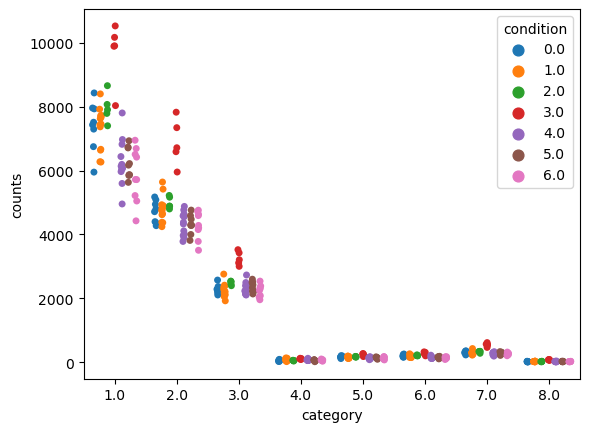

In [135]:
g = sns.stripplot(data=df_test_2,
                  x='category',
                  y='counts',
                  hue='condition',
                  dodge=True)


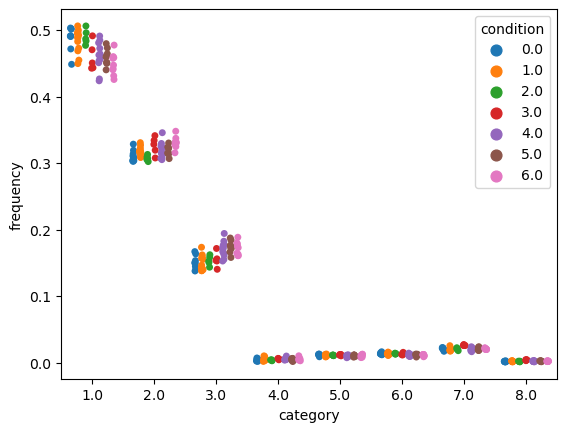

In [136]:
g = sns.stripplot(data=df_test_2,
                  x='category',
                  y='frequency',
                  hue='condition',
                  dodge=True)


In [25]:
df_test_2 = compare_tracks.compare_frequencies_all_track_categories(
    [analysis_metadata.item().get('path_tracks_ad_wildtype'),
     path_ada_tracks,
     ada_shock_tracks,
     ada_shock_tracks,
     ada_shock_tracks_repeat_2,
     ada_shock_tracks_repeat_2,
     ada_drug_tracks,
     ada_drug_tracks,
     ada_drug_tracks],
    [['Cell'],
     ['Cell'],
     ['Cell', 'before'],
     ['Cell', 'after'],
     ['Cell', 'before'],
     ['Cell', 'after'],
     ['Cell', 'no-treatment'],
     ['Cell', 'dmso'],
     ['Cell', 'ck666']])


folders to mine for track set 1:
0_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
1_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
2_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s
3_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell007_1s
4_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell010_1s
5_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
6_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
7_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s


loading tracks in set..
tracks in set 1 of 8
tracks in set 2 of 8
tracks in set 3 of 8
tracks in set 4 of 8
tracks in set 5 of 8
tracks in set 6 of 8
tracks in set 7 of 8
tracks in set 8 of 8





folders to mine for track set 2:
8_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell001_1s
9_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell002_1s
10_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell003_1s
11_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment

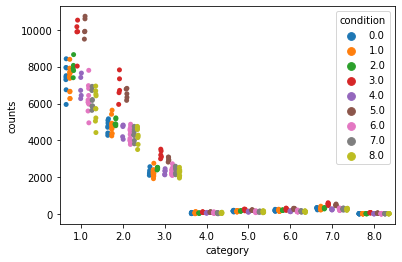

In [26]:
g = sns.stripplot(data=df_test_2,
                  x='category',
                  y='counts',
                  hue='condition',
                  dodge=True)


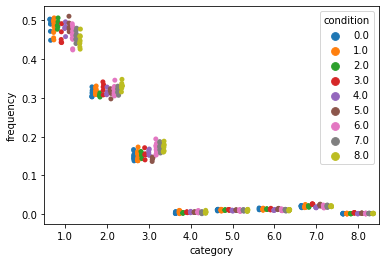

In [27]:
g = sns.stripplot(data=df_test_2,
                  x='category',
                  y='frequency',
                  hue='condition',
                  dodge=True)


# compare features between conditions

In [137]:
plt.style.use('default')

plot_position = 1 

f = plt.figure(dpi=500, figsize=(30,30))

feature_values = [df_merged_features.values,
                  df_ada_merged_features.values,
                  df_ada_shock_merged_features_before.values,
                  df_ada_shock_merged_features_after.values,
                  df_ada_drug_merged_features_notreatment.values,
                  df_ada_drug_merged_features_dmso.values,
                  df_ada_drug_merged_features_ck666.values]

num_columns = 5
num_rows = np.ceil(len(feature_units)/num_columns)


for i in range(len(feature_units)):
    print('generating feature: ', i)
    ax = f.add_subplot(num_rows, num_columns, plot_position)
    plot_position+=1
    
    min_val_features = []
    max_val_features = []
    
    for j, feature_set in enumerate(feature_values):
        
        min_val_features.append(np.min(feature_set[:,i]))
        max_val_features.append(np.max(feature_set[:,i]))
        
        ax.hist(feature_set[:,i], 
                label='condition' + str(j), 
                bins='auto', 
                density=True, 
                histtype='step', 
                cumulative=True)

    ax.set_xlabel(df_merged_features.columns[i]+' ('+feature_units[i]+')',fontsize=5)
    ax.set_ylabel('cumulative frequency',fontsize=5)
    ax.set_xlim([np.max(min_val_features),
                 np.min(max_val_features)])
    ax.tick_params(axis='both', which='major', labelsize=3)
    ax.tick_params(axis='both', which='minor', labelsize=3)
    plt.legend(loc='best')
    plt.grid()
    
    
f.suptitle('track features, comparing conditions')

generating feature:  0
generating feature:  1
generating feature:  2
generating feature:  3
generating feature:  4
generating feature:  5
generating feature:  6
generating feature:  7
generating feature:  8
generating feature:  9
generating feature:  10
generating feature:  11
generating feature:  12
generating feature:  13
generating feature:  14
generating feature:  15
generating feature:  16
generating feature:  17
generating feature:  18
generating feature:  19
generating feature:  20
generating feature:  21
generating feature:  22
generating feature:  23
generating feature:  24
generating feature:  25
generating feature:  26
generating feature:  27
generating feature:  28
generating feature:  29
generating feature:  30
generating feature:  31


Text(0.5, 0.98, 'track features, comparing conditions')

In [144]:
plt.style.use('default')

plot_position = 1 

f = plt.figure(dpi=500, figsize=(30,30))

feature_values = [df_ada_drug_merged_features_notreatment.values,
                  df_ada_drug_merged_features_dmso.values]

num_columns = 5
num_rows = np.ceil(len(feature_units)/num_columns)


for i in range(len(feature_units)):
    print('generating feature: ', i)
    ax = f.add_subplot(num_rows, num_columns, plot_position)
    plot_position+=1
    
    min_val_features = []
    max_val_features = []
    
    for j, feature_set in enumerate(feature_values):
        
        min_val_features.append(np.min(feature_set[:,i]))
        max_val_features.append(np.max(feature_set[:,i]))
        
        ax.hist(feature_set[:,i], 
                label='condition' + str(j), 
                bins='auto', 
                density=True, 
                histtype='step', 
                cumulative=True)

    ax.set_xlabel(df_merged_features.columns[i]+' ('+feature_units[i]+')',fontsize=5)
    ax.set_ylabel('cumulative frequency',fontsize=5)
    ax.set_xlim([np.max(min_val_features),
                 np.min(max_val_features)])
    ax.tick_params(axis='both', which='major', labelsize=3)
    ax.tick_params(axis='both', which='minor', labelsize=3)
    plt.legend(loc='best')
    plt.grid()
    
    
f.suptitle('track features, comparing conditions')

generating feature:  0
generating feature:  1
generating feature:  2
generating feature:  3
generating feature:  4
generating feature:  5
generating feature:  6
generating feature:  7
generating feature:  8
generating feature:  9
generating feature:  10
generating feature:  11
generating feature:  12
generating feature:  13
generating feature:  14
generating feature:  15
generating feature:  16
generating feature:  17
generating feature:  18
generating feature:  19
generating feature:  20
generating feature:  21
generating feature:  22
generating feature:  23
generating feature:  24
generating feature:  25
generating feature:  26
generating feature:  27
generating feature:  28
generating feature:  29
generating feature:  30
generating feature:  31


Text(0.5, 0.98, 'track features, comparing conditions')

In [146]:
plt.style.use('default')

plot_position = 1 

f = plt.figure(dpi=500, figsize=(30,30))

feature_values = [df_ada_drug_merged_features_dmso.values,
                  df_ada_drug_merged_features_ck666.values]

num_columns = 5
num_rows = np.ceil(len(feature_units)/num_columns)


for i in range(len(feature_units)):
    print('generating feature: ', i)
    ax = f.add_subplot(num_rows, num_columns, plot_position)
    plot_position+=1
    
    min_val_features = []
    max_val_features = []
    
    for j, feature_set in enumerate(feature_values):
        
        min_val_features.append(np.min(feature_set[:,i]))
        max_val_features.append(np.max(feature_set[:,i]))
        
        ax.hist(feature_set[:,i], 
                label='condition' + str(j), 
                bins='auto', 
                density=True, 
                histtype='step', 
                cumulative=True)

    ax.set_xlabel(df_merged_features.columns[i]+' ('+feature_units[i]+')',fontsize=5)
    ax.set_ylabel('cumulative frequency',fontsize=5)
    ax.set_xlim([np.max(min_val_features),
                 np.min(max_val_features)])
    ax.tick_params(axis='both', which='major', labelsize=3)
    ax.tick_params(axis='both', which='minor', labelsize=3)
    plt.legend(loc='best')
    plt.grid()
    
    
f.suptitle('track features, comparing conditions')

generating feature:  0
generating feature:  1
generating feature:  2
generating feature:  3
generating feature:  4
generating feature:  5
generating feature:  6
generating feature:  7
generating feature:  8
generating feature:  9
generating feature:  10
generating feature:  11
generating feature:  12
generating feature:  13
generating feature:  14
generating feature:  15
generating feature:  16
generating feature:  17
generating feature:  18
generating feature:  19
generating feature:  20
generating feature:  21
generating feature:  22
generating feature:  23
generating feature:  24
generating feature:  25
generating feature:  26
generating feature:  27
generating feature:  28
generating feature:  29
generating feature:  30
generating feature:  31


Text(0.5, 0.98, 'track features, comparing conditions')

# upload DNM2 channels and calculate area of colonies (some cmeAnalysis masks are blank)


folders to mine:
0_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
1_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
2_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s
3_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell007_1s
4_200804_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell010_1s
5_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell004_1s
6_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell005_1s
7_200819_ap2-dnm2_ap2-dnm2_wildtype_no-treatment_Cell006_1s




/Users/cynashirazinejad/Documents/GitHub/Jin_Shirazinejad_et_al_branched_actin_manuscript/analysis/simplified_workflow/cmeAnalysisPostProcessingSimplified/compare_tracks.py:59: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  grayscale_image = rgb2gray(raw_image)


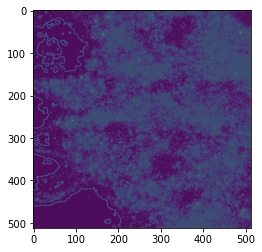

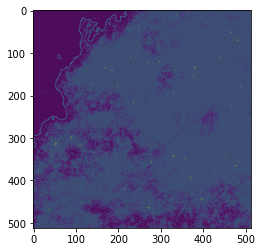

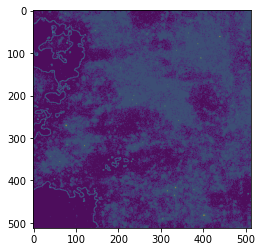

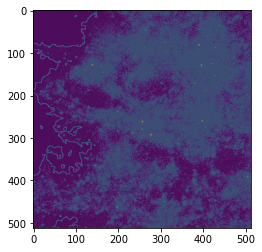

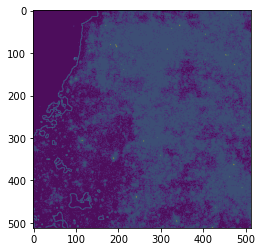

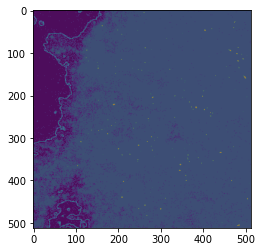

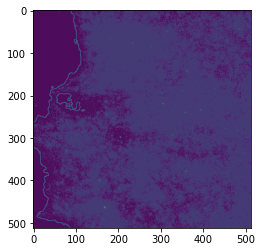

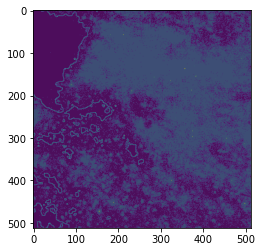

In [38]:
ad_tracks_cell_area = compare_tracks.calculate_fraction_area_occupied_by_cells(analysis_metadata.item().get('path_tracks_ad_wildtype'),
                                                         ['Cell'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
8_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell001_1s
9_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell002_1s
10_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell003_1s
11_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell008_1s
12_200804_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell009_1s
13_200819_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell001_1s
14_200819_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell002_1s
15_200819_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell003_1s
16_200722_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell001_1s
17_200722_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell002_1s
18_200722_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell003_1s
19_200722_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell004_1s
20_200722_ap2-dnm2-arpc3_ap2-dnm2_wildtype_no-treatment_Cell005_1s




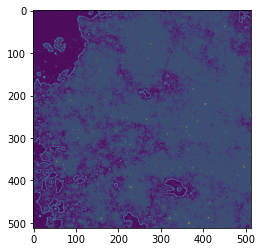

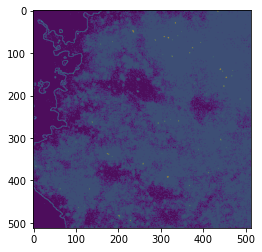

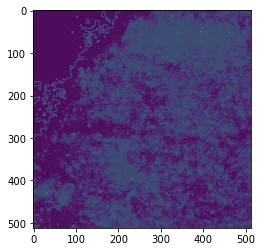

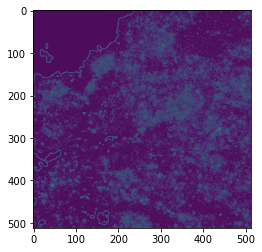

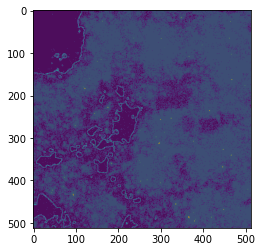

...

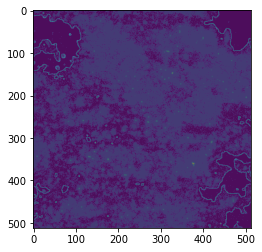

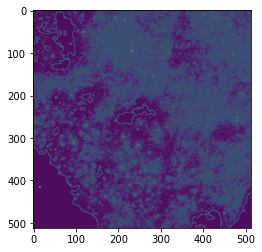

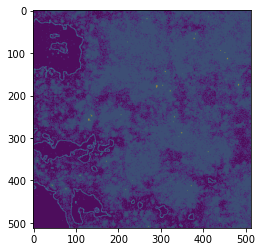

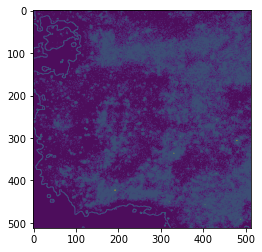

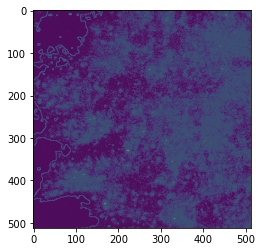

In [39]:
ada_tracks_cell_area = compare_tracks.calculate_fraction_area_occupied_by_cells(path_ada_tracks,
                                                         ['Cell'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
22_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell1_1s
24_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell2_1s
26_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell3_1s
28_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell4_1s
30_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell5_1s




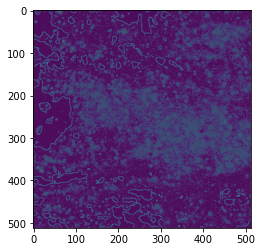

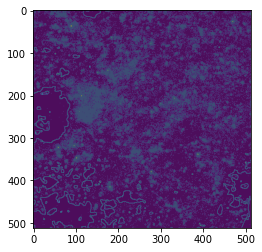

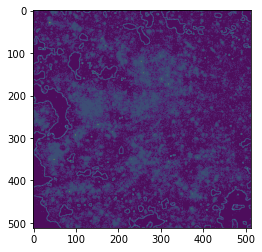

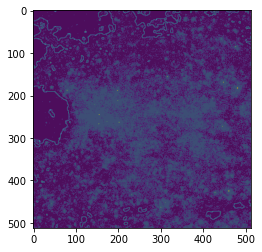

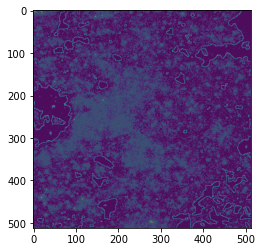

In [40]:
ada_tracks_cell_area_before = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_shock_tracks,
                                                         ['Cell', 'before'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
21_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell1_1s
23_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell2_1s
25_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell3_1s
27_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell4_1s
29_211203_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell5_1s




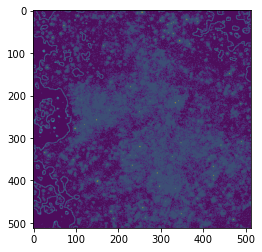

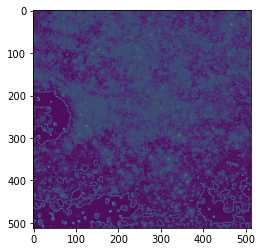

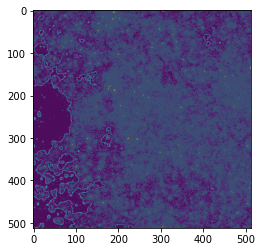

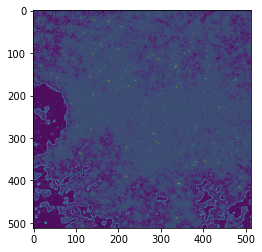

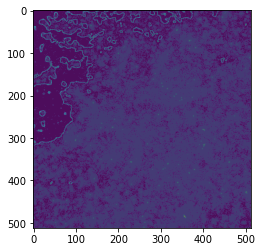

In [41]:
ada_tracks_cell_area_after = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_shock_tracks,
                                                         ['Cell', 'after'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
43_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell1_1s
44_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell2_1s
45_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell3_1s
46_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell4_1s
47_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell5_1s
48_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell6_1s
55_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell1_1s
56_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell2_1s
57_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell3_1s
58_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell4_1s
59_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell5_1s
60_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_no-treatment_Cell6_1s




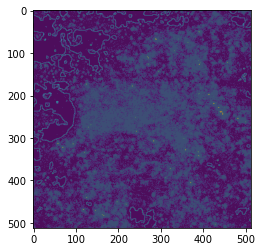

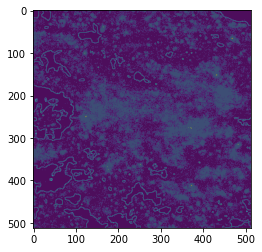

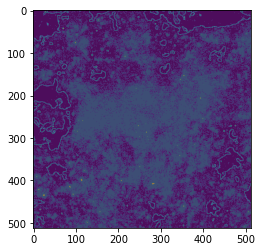

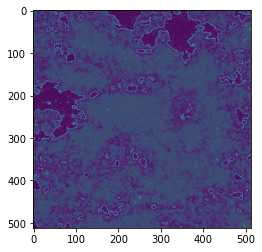

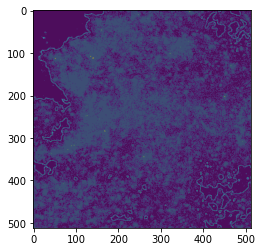

...

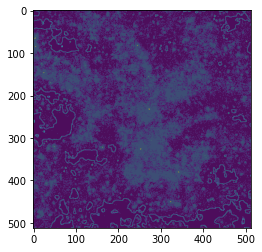

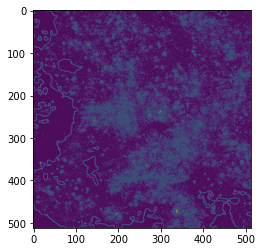

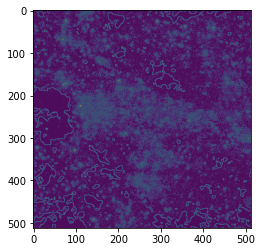

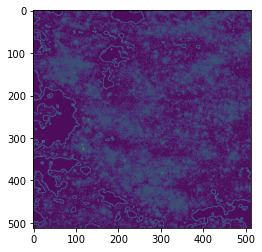

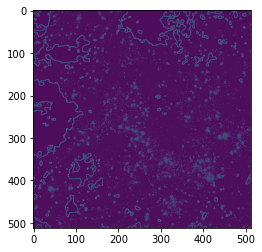

In [42]:
ada_tracks_cell_area_drug_notreatment = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_drug_tracks,
                                                         ['Cell', 'no-treatment'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
34_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell1_1s
35_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell2_1s
36_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell3_1s
40_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell1_1s
41_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell2_1s
42_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell3_1s
52_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell1_1s
53_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell2_1s
54_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_dmso_Cell3_1s




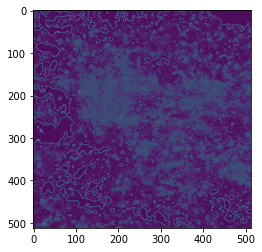

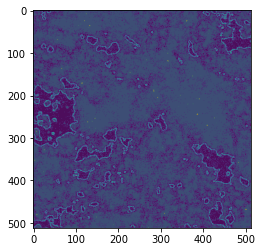

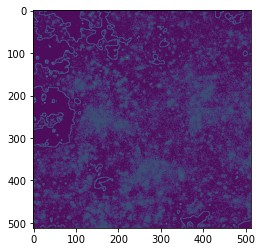

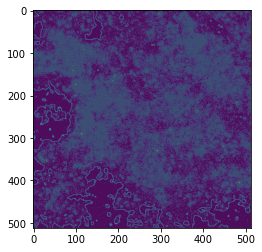

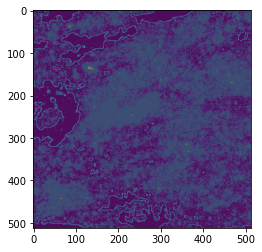

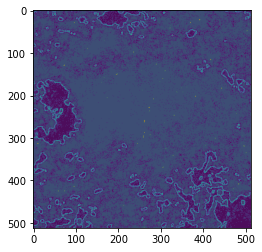

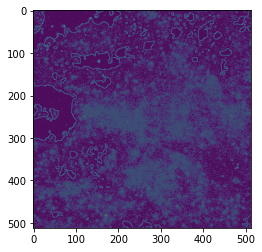

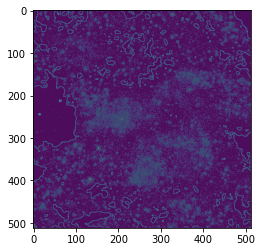

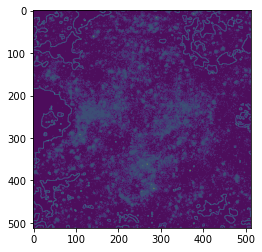

In [43]:
ada_tracks_cell_area_drug_dmso = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_drug_tracks,
                                                         ['Cell', 'dmso'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
31_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell1_1s
32_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell2_1s
33_211210_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell3_1s
37_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell1_1s
38_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell2_1s
39_211214_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell3_1s
49_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell1_1s
50_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell2_1s
51_211221_ap2-dnm2-arpc3_ap2-dnm2_drug_ck666_Cell3_1s




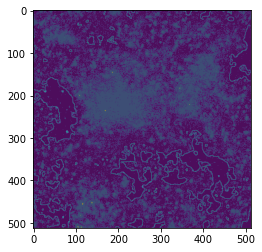

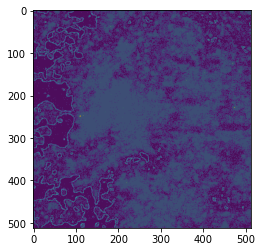

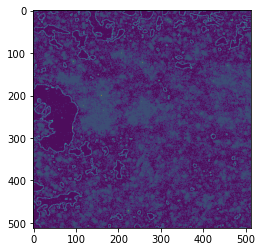

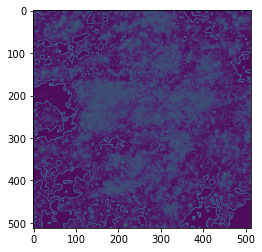

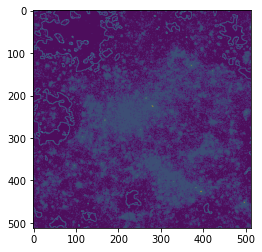

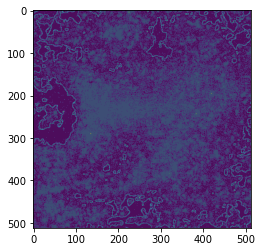

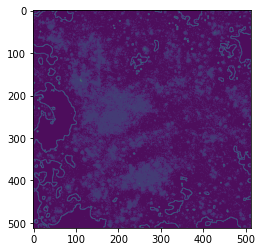

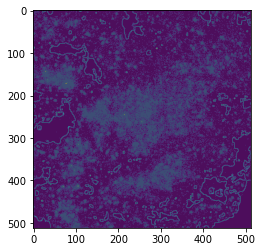

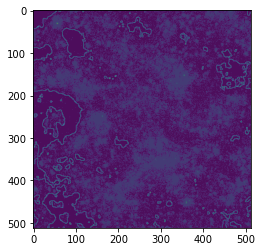

In [44]:
ada_tracks_cell_area_drug_ck666 = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_drug_tracks,
                                                         ['Cell', 'ck666'],
                                                         2,
                                                         imagesize=[512,512])

# compare fractions of occupany between clusters

In [45]:
df_comp_fractions = compare_tracks.compare_components_between_conditions(
                        unique_user_saved_outputs,
                        [df_merged_features, 
                         df_ada_merged_features],
                        [ad_tracks_cell_area,
                         ada_tracks_cell_area],
                         .108*.108*512*512*4)

0.08894806924101198
0.24567243675099867
0.11291611185086552
0.16458055925432757
0.3878828229027963
0.08158390949088623
0.23984915147705846
0.10320553111250785
0.16040226272784414
0.41495914519170335
0.13109243697478992
0.2280672268907563
0.10319327731092437
0.1677310924369748
0.3699159663865546
0.09869773817683344
0.2393420150788211
0.11144619602467444
0.16956819739547635
0.38094585332419467
0.09976282241328195
0.23613993477616366
0.1068781500148236
0.17758671805514378
0.37963237474058703
0.11697402072957329
0.25831202046035806
0.09785973886121954
0.17149010634001885
0.35536411360883025
0.08901020650367909
0.2607405649181106
0.09589366247329693
0.1762402088772846
0.3781153572276288
0.10456609485368315
0.25302724520686176
0.10456609485368315
0.17494954591321898
0.36289101917255295
0.11173184357541899
0.2392657621707901
0.10438946528332003
0.16153232242617718
0.3830806065442937
0.09014565017714211
0.2654507282508857
0.09408214145125311
0.1779294055898176
0.37239207453090145
0.07825154835

In [46]:
df_comp_fractions

,experiment_number,component_number,fraction,rates,condition
0,0.0,0.0,0.088948,0.060863,0.0
1,0.0,1.0,0.245672,0.168103,0.0
2,0.0,2.0,0.112916,0.077264,0.0
3,0.0,3.0,0.164581,0.112615,0.0
4,0.0,4.0,0.387883,0.265412,0.0
...,...,...,...,...,...
100,20.0,0.0,0.080637,0.046427,1.0
101,20.0,1.0,0.250359,0.144144,1.0
102,20.0,2.0,0.116335,0.066980,1.0
103,20.0,3.0,0.173705,0.100011,1.0


In [48]:
# old_fractions = pd.read_csv('/Users/cynashirazinejad/Desktop/test.zip')

In [49]:
old_fractions

NameError: name 'old_fractions' is not defined

##### import all necessary Python modules

In [ ]:
old_fractions = old_fractions['fraction']

In [ ]:
ad_tracks_cell_area

In [ ]:
ada_tracks_cell_area

In [50]:
df_comp_fractions = compare_tracks.compare_components_between_conditions(
                        unique_user_saved_outputs,
                        [df_merged_features, 
                         df_ada_merged_features,
                         df_ada_shock_merged_features_before,
                         df_ada_shock_merged_features_after],
                        [ad_tracks_cell_area,
                         ada_tracks_cell_area,
                         ada_tracks_cell_area_before,
                         ada_tracks_cell_area_after],
                         .108*.108*512*512*4)

0.08894806924101198
0.24567243675099867
0.11291611185086552
0.16458055925432757
0.3878828229027963
0.08158390949088623
0.23984915147705846
0.10320553111250785
0.16040226272784414
0.41495914519170335
0.13109243697478992
0.2280672268907563
0.10319327731092437
0.1677310924369748
0.3699159663865546
0.09869773817683344
0.2393420150788211
0.11144619602467444
0.16956819739547635
0.38094585332419467
0.09976282241328195
0.23613993477616366
0.1068781500148236
0.17758671805514378
0.37963237474058703
0.11697402072957329
0.25831202046035806
0.09785973886121954
0.17149010634001885
0.35536411360883025
0.08901020650367909
0.2607405649181106
0.09589366247329693
0.1762402088772846
0.3781153572276288
0.10456609485368315
0.25302724520686176
0.10456609485368315
0.17494954591321898
0.36289101917255295
0.11173184357541899
0.2392657621707901
0.10438946528332003
0.16153232242617718
0.3830806065442937
0.09014565017714211
0.2654507282508857
0.09408214145125311
0.1779294055898176
0.37239207453090145
0.07825154835

(0.0, 0.5)

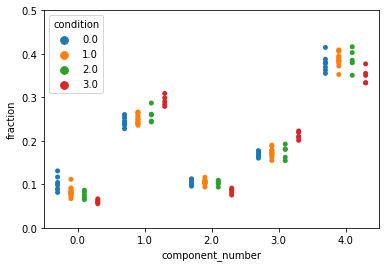

In [51]:
g = sns.stripplot(data=df_comp_fractions,
                  x='component_number',
                  y='fraction',
                  hue='condition',
                  dodge=True,
                  jitter=False)
plt.ylim(0,0.5)

In [52]:
df_comp_fractions = compare_tracks.compare_components_between_conditions(
                        unique_user_saved_outputs,
                        [df_merged_features, 
                         df_ada_merged_features,
                         df_ada_shock_merged_features_before,
                         df_ada_shock_merged_features_after,
                         df_ada_drug_merged_features_notreatment,
                         df_ada_drug_merged_features_dmso,
                         df_ada_drug_merged_features_ck666],
                        [ad_tracks_cell_area,
                         ada_tracks_cell_area,
                         ada_tracks_cell_area_before,
                         ada_tracks_cell_area_after,
                         ada_tracks_cell_area_drug_notreatment,
                         ada_tracks_cell_area_drug_dmso,
                         ada_tracks_cell_area_drug_ck666],
                         .108*.108*512*512*4)

0.08894806924101198
0.24567243675099867
0.11291611185086552
0.16458055925432757
0.3878828229027963
0.08158390949088623
0.23984915147705846
0.10320553111250785
0.16040226272784414
0.41495914519170335
0.13109243697478992
0.2280672268907563
0.10319327731092437
0.1677310924369748
0.3699159663865546
0.09869773817683344
0.2393420150788211
0.11144619602467444
0.16956819739547635
0.38094585332419467
0.09976282241328195
0.23613993477616366
0.1068781500148236
0.17758671805514378
0.37963237474058703
0.11697402072957329
0.25831202046035806
0.09785973886121954
0.17149010634001885
0.35536411360883025
0.08901020650367909
0.2607405649181106
0.09589366247329693
0.1762402088772846
0.3781153572276288
0.10456609485368315
0.25302724520686176
0.10456609485368315
0.17494954591321898
0.36289101917255295
0.11173184357541899
0.2392657621707901
0.10438946528332003
0.16153232242617718
0.3830806065442937
0.09014565017714211
0.2654507282508857
0.09408214145125311
0.1779294055898176
0.37239207453090145
0.07825154835

(0.0, 0.5)

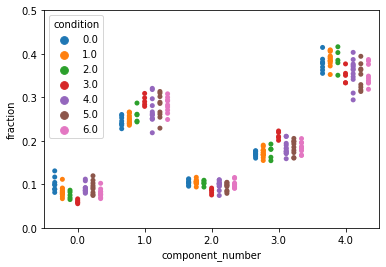

In [53]:
g = sns.stripplot(data=df_comp_fractions,
                  x='component_number',
                  y='fraction',
                  hue='condition',
                  dodge=True,
                  jitter=False)
plt.ylim(0,0.5)

(0.0, 0.5)

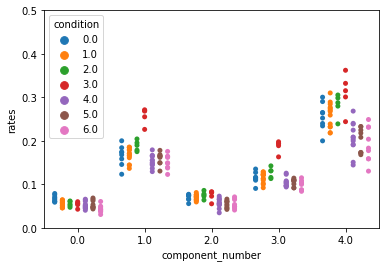

In [54]:
g = sns.stripplot(data=df_comp_fractions,
                  x='component_number',
                  y='rates',
                  hue='condition',
                  dodge=True,
                  jitter=False)
plt.ylim(0,0.5)


folders to mine:
62_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell1_1s
64_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell2_1s
66_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell3_1s
68_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell4_1s
70_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_before_Cell5_1s




/Users/cynashirazinejad/Documents/GitHub/Jin_Shirazinejad_et_al_branched_actin_manuscript/analysis/simplified_workflow/cmeAnalysisPostProcessingSimplified/compare_tracks.py:59: FutureWarning: The behavior of rgb2gray will change in scikit-image 0.19. Currently, rgb2gray allows 2D grayscale image to be passed as inputs and leaves them unmodified as outputs. Starting from version 0.19, 2D arrays will be treated as 1D images with 3 channels.
  grayscale_image = rgb2gray(raw_image)


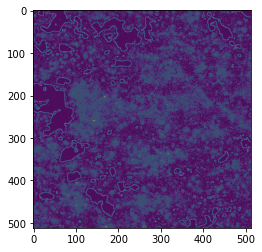

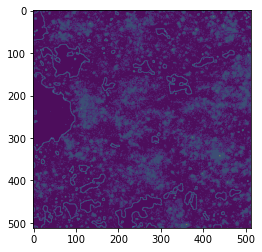

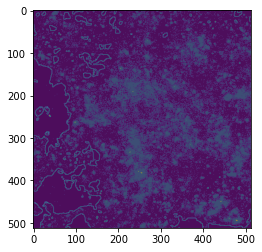

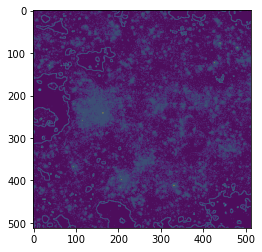

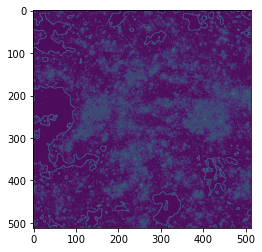

In [55]:
ada_tracks_cell_area_before_repeat_2 = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_shock_tracks_repeat_2,
                                                         ['Cell', 'before'],
                                                         2,
                                                         imagesize=[512,512])


folders to mine:
61_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell1_1s
63_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell2_1s
65_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell3_1s
67_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell4_1s
69_211208_ap2-dnm2-arpc3_ap2-dnm2_hypotonic_after_Cell5_1s




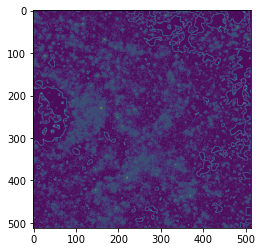

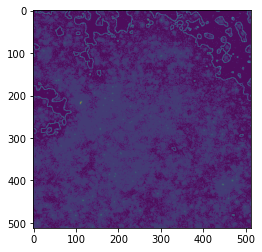

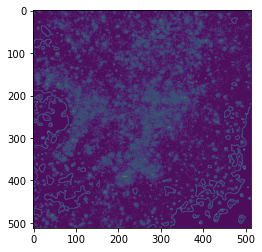

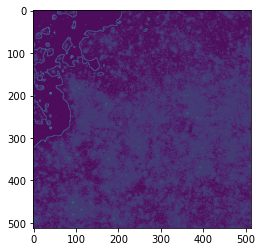

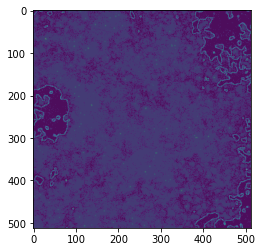

In [56]:
ada_tracks_cell_area_after_repeat_2 = compare_tracks.calculate_fraction_area_occupied_by_cells(ada_shock_tracks_repeat_2,
                                                         ['Cell', 'after'],
                                                         2,
                                                         imagesize=[512,512])

In [60]:
df_comp_fractions = compare_tracks.compare_components_between_conditions(
                        unique_user_saved_outputs,
                        [df_merged_features, 
                         df_ada_merged_features,
                         df_ada_shock_merged_features_before,
                         df_ada_shock_merged_features_after,
                         df_ada_shock_merged_features_before_repeat_2,
                         df_ada_shock_merged_features_after_repeat_2,
                         df_ada_drug_merged_features_notreatment,
                         df_ada_drug_merged_features_dmso,
                         df_ada_drug_merged_features_ck666],
                        [ad_tracks_cell_area,
                         ada_tracks_cell_area,
                         ada_tracks_cell_area_before,
                         ada_tracks_cell_area_after,
                         ada_tracks_cell_area_before_repeat_2,
                         ada_tracks_cell_area_after_repeat_2,
                         ada_tracks_cell_area_drug_notreatment,
                         ada_tracks_cell_area_drug_dmso,
                         ada_tracks_cell_area_drug_ck666],
                         .108*.108*512*512*4)

0.08894806924101198
0.24567243675099867
0.11291611185086552
0.16458055925432757
0.3878828229027963
0.08158390949088623
0.23984915147705846
0.10320553111250785
0.16040226272784414
0.41495914519170335
0.13109243697478992
0.2280672268907563
0.10319327731092437
0.1677310924369748
0.3699159663865546
0.09869773817683344
0.2393420150788211
0.11144619602467444
0.16956819739547635
0.38094585332419467
0.09976282241328195
0.23613993477616366
0.1068781500148236
0.17758671805514378
0.37963237474058703
0.11697402072957329
0.25831202046035806
0.09785973886121954
0.17149010634001885
0.35536411360883025
0.08901020650367909
0.2607405649181106
0.09589366247329693
0.1762402088772846
0.3781153572276288
0.10456609485368315
0.25302724520686176
0.10456609485368315
0.17494954591321898
0.36289101917255295
0.11173184357541899
0.2392657621707901
0.10438946528332003
0.16153232242617718
0.3830806065442937
0.09014565017714211
0.2654507282508857
0.09408214145125311
0.1779294055898176
0.37239207453090145
0.07825154835

In [67]:
df_ada_shock_merged_features_before_repeat_2


,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status


In [80]:
df_ada_shock_merged_features_before

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status
10522,214.0,377.798001,207.837669,2.816601,6.237207,3.880280,0.442730,0.894743,168.0,149.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,9.226541,-4.388861,0,0.0
10523,207.0,912.649800,226.664902,5.586988,4.275330,5.280566,0.668868,1.023994,161.0,104.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,9.165220,-4.239877,0,0.0
10524,195.0,362.120149,335.352165,10.958896,10.719659,2.915594,0.334168,0.657747,99.0,142.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,9.533231,-5.132499,0,1.0
10525,193.0,1100.749483,343.852558,6.511609,2.894950,6.365068,0.502067,0.928109,82.0,99.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,9.303862,-5.164870,0,0.0
10526,190.0,880.934932,324.005804,6.101632,4.389072,5.028064,0.557094,0.770188,80.0,182.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,9.903669,-5.781659,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88305,2.0,23.731464,7.934053,1.968504,0.316231,3.337242,1.401953,1.059210,6.0,4.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,-7.095715,2.311603,3,0.0
88306,2.0,40.397827,19.014836,2.372008,1.150721,1.776454,1.444474,0.891232,5.0,8.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,-6.746442,1.253945,3,0.0
88307,2.0,32.788156,22.030472,0.690115,2.751385,2.701778,0.659188,0.608098,6.0,9.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,-6.500541,0.543004,3,0.0
88308,2.0,29.623015,13.335667,1.136658,0.472216,6.092471,1.759679,1.679930,5.0,4.0,...,ap2-dnm2-arpc3,ap2-dnm2,hypotonic,before,1s,211203,-7.243482,2.739535,3,0.0


In [84]:
df_ada_shock_merged_features_before_repeat_2

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status


In [85]:
df_ada_shock_merged_features_before_repeat_2

,lifetime,max_int_ap2,max_int_dnm2,dist_traveled_ap2,dist_traveled_dnm2,max_dist_between_ap2_dnm2,md_ap2,md_dnm2,time_to_peak_ap2,time_to_peak_dnm2,...,cell_line_tags,current_tracked_channels,experiment_type,cell_condition,framerate,date,PC-0,PC-1,gmm_predictions,ccp_status


In [90]:
df_comp_fractions = compare_tracks.compare_components_between_conditions(
                        unique_user_saved_outputs,
                        [df_merged_features,
                         df_ada_shock_merged_features_before,
                         df_ada_shock_merged_features_after,
                         df_ada_shock_merged_features_before_repeat_2,
                         df_ada_shock_merged_features_after_repeat_2],
                        [ad_tracks_cell_area,
                         ada_tracks_cell_area_before,
                         ada_tracks_cell_area_after,
                         ada_tracks_cell_area_before_repeat_2,
                         ada_tracks_cell_area_after_repeat_2],
                         .108*.108*512*512*4)

0.08894806924101198
0.24567243675099867
0.11291611185086552
0.16458055925432757
0.3878828229027963
0.08158390949088623
0.23984915147705846
0.10320553111250785
0.16040226272784414
0.41495914519170335
0.13109243697478992
0.2280672268907563
0.10319327731092437
0.1677310924369748
0.3699159663865546
0.09869773817683344
0.2393420150788211
0.11144619602467444
0.16956819739547635
0.38094585332419467
0.09976282241328195
0.23613993477616366
0.1068781500148236
0.17758671805514378
0.37963237474058703
0.11697402072957329
0.25831202046035806
0.09785973886121954
0.17149010634001885
0.35536411360883025
0.08901020650367909
0.2607405649181106
0.09589366247329693
0.1762402088772846
0.3781153572276288
0.10456609485368315
0.25302724520686176
0.10456609485368315
0.17494954591321898
0.36289101917255295
0.07528044330314908
0.2870658197053656
0.09393161238005136
0.19272874712799026
0.3509933774834437
0.06934011325551832
0.2600254247081937
0.10955737894371895
0.1813243961631804
0.3797526869293886
0.065173373829

(0.0, 0.5)

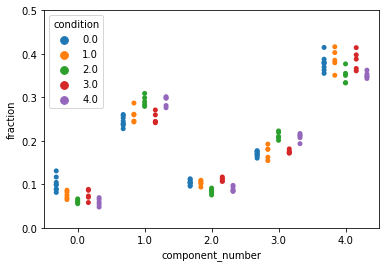

In [91]:
g = sns.stripplot(data=df_comp_fractions,
                  x='component_number',
                  y='fraction',
                  hue='condition',
                  dodge=True,
                  jitter=False)
plt.ylim(0,0.5)

(0.0, 0.5)

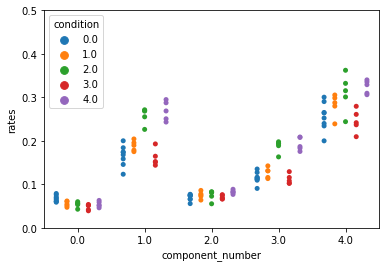

In [92]:
g = sns.stripplot(data=df_comp_fractions,
                  x='component_number',
                  y='rates',
                  hue='condition',
                  dodge=True,
                  jitter=False)
plt.ylim(0,0.5)